# Estimating the economical loss to critical infrastructure by flooding given the present meteorological parameters

## Determining the degree of damage caused towards critical infrastructure

The quantification of damage is possible to determine due to the coherent interferometry between satellite imagery took before and after a disaster. By analysing the damage caused to classified structure it is possible to establish a damge coefficient (COD). Since, human made structures present themselves as highly coherent, then the COD would would demonstrate a difference of coherence between the compared images after structures show physical change. Hence, a relationshop can be established. A greater loss of coherence is directly proportional to the damage a structure suffers. However, this method is limited due to the fact that satellite imagery does not allow to analyze the internal damage of a structure.  

## Acknowledgments:
   The method for the damage analysis through the use of satellite imagery implemented through this project was first sustained by Cheryl WJ Tay ,Sang-Ho Yun ,Shi Tong Chin ,Alok Bhardwaj ,Jungkyo Jung, and Emma M. Hill, in 'Rapid flood and damage mapping using synthetic aperture radar in response to Typhoon Hagibis'.

## Reference:
    Tay, C.W.J., Yun, S., Chin, S.T. et al. Rapid flood and damage mapping using synthetic aperture radar in response to Typhoon Hagibis, Japan. Sci Data 7, 100 (2020). https://doi.org/10.1038/s41597-020-0443-5


### Case Study: Hurracaine Harvey, 2017, Houston, Texas.

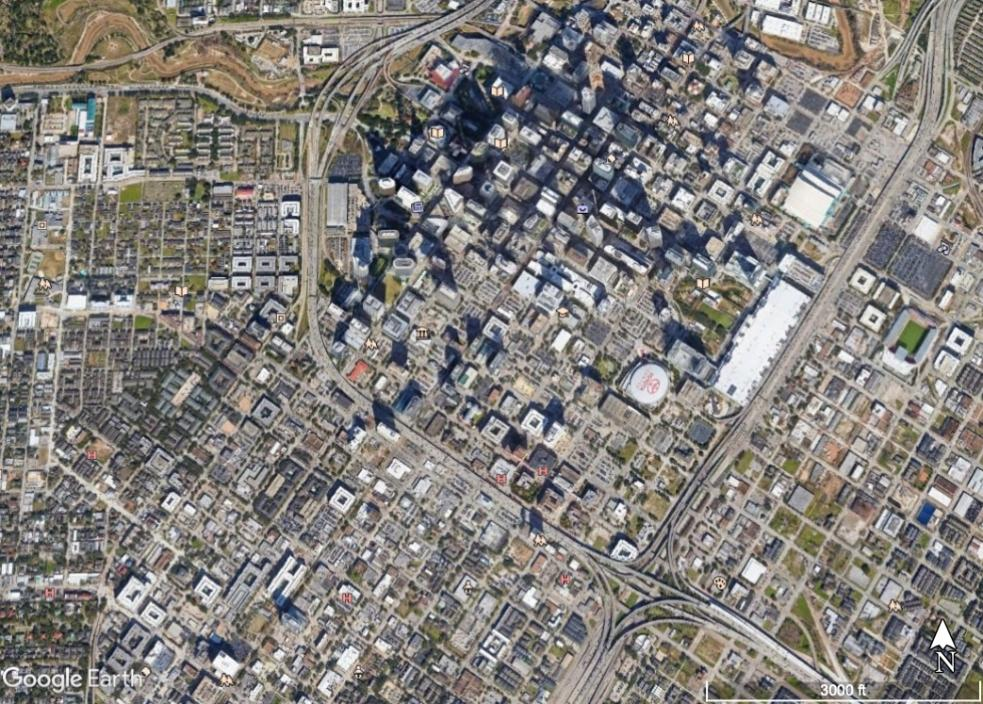

In [50]:
from IPython.display import Image
Image(filename = "Before.jpg")

### Satellite imagery after the disaster:
    This image is taken by satellite Sentinel Copernicus 1A, and processed through Aria. Blue pixels show the concentration of water in the area.

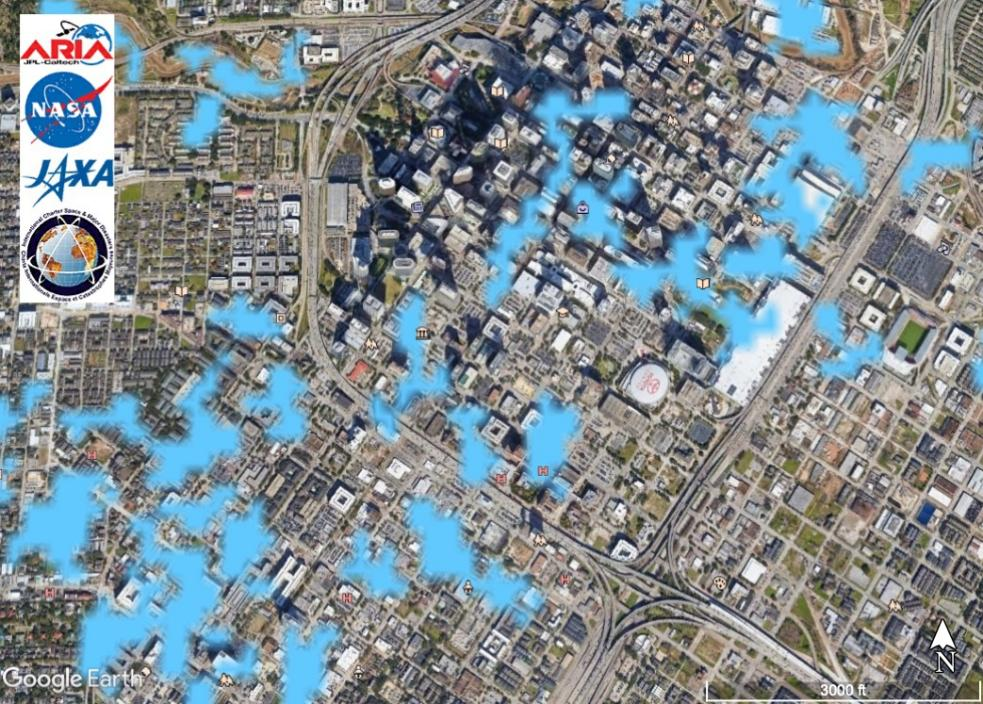

In [51]:
from IPython.display import Image
Image(filename = "After.jpg")

In [3]:
# A negative COD just indicates that changes detects are previous to the event or caused by external factors that are not taken into account.
y_co_evento  = float(input("Introduce the value for interferometry coherence before the flooding: "))
y_pre_evento = float(input("Introduce the value for interferometry coherence after the flooding occured: "))
COD = y_co_evento - y_pre_evento
print("\nCoherence Difference: ",COD)

Introduce the value for interferometry coherence before the flooding: 0.6
Introduce the value for interferometry coherence after the flooding occured: 0.3

Coherence Difference:  0.3


#### The scale to be used, given by the Natural Hazards Research Center (NHRC):
Reference: 
- Blong, R. A review of damage intensity scales. Natural Hazards 29, 57–76 (2003). https://doi.org/10.1023/A:1022960414329

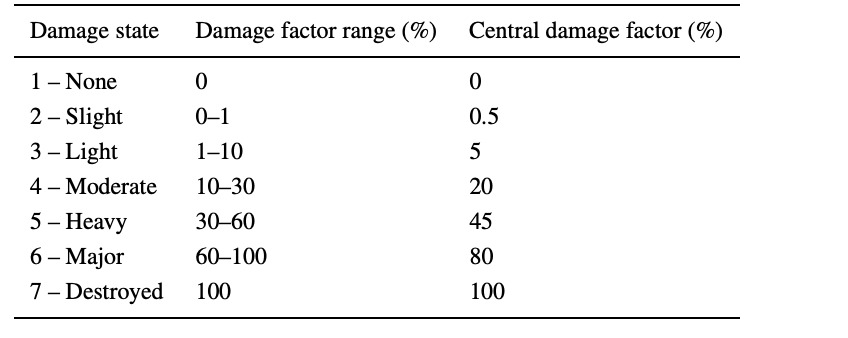

In [2]:
from IPython.display import Image
Image(filename = "Picture C-2.jpeg")

### Presenting the COD as a percentage:

In [4]:
COD_porcentual = COD*100
print("The coherence percentage difference value is {}%".format(COD_porcentual))

The coherence percentage difference value is 30.0%


## Specification of damage of critical infrastructure in terms of COD:

For the sake of simplicity in this demonstration, the only structures taken into account are hospitals and educational facilities, who's monetary value is already determined and shown.

In [5]:
def hospitales(COD):
    if  0.05 < COD_porcentual <= 0.30:
        perdida = 0.003 * valor_hospital
    elif 0.30 < COD_porcentual <= 1.25:
        perdida = 0.0125 * valor_hospital
    elif 1.25 < COD_porcentual <= 3.50:
        perdida = 0.035 * valor_hospital
    elif 3.50 < COD_porcentual <= 7.50:
        perdida = 0.065 * valor_hospital
    elif 7.50 < COD_porcentual <= 20.0:
        perdida = 0.1375 * valor_hospital
    elif 20.0 < COD_porcentual <= 65.0:
        perdida = 0.5 * valor_hospital
    return  perdida    

def escuelas(COD):
    if 0.05 < COD_porcentual <= 0.30:
        perdida = 0.003 * valor_escuela
    elif 0.30 < COD_porcentual <= 1.25:
        perdida = 0.0125 * valor_escuela
    elif 1.25 < COD_porcentual <= 3.50:
        perdida = 0.035 * valor_escuela
    elif 3.50 < COD_porcentual <= 7.50:
        perdida = 0.065 * valor_escuela
    elif 7.50 < COD_porcentual <= 20.0:
        perdida = 0.1375 * valor_escuela
    elif 20.0 < COD_porcentual <= 65.0:
        perdida = 0.5 * valor_escuela
    return  perdida 

### Flood Proxy Map from ALOS2

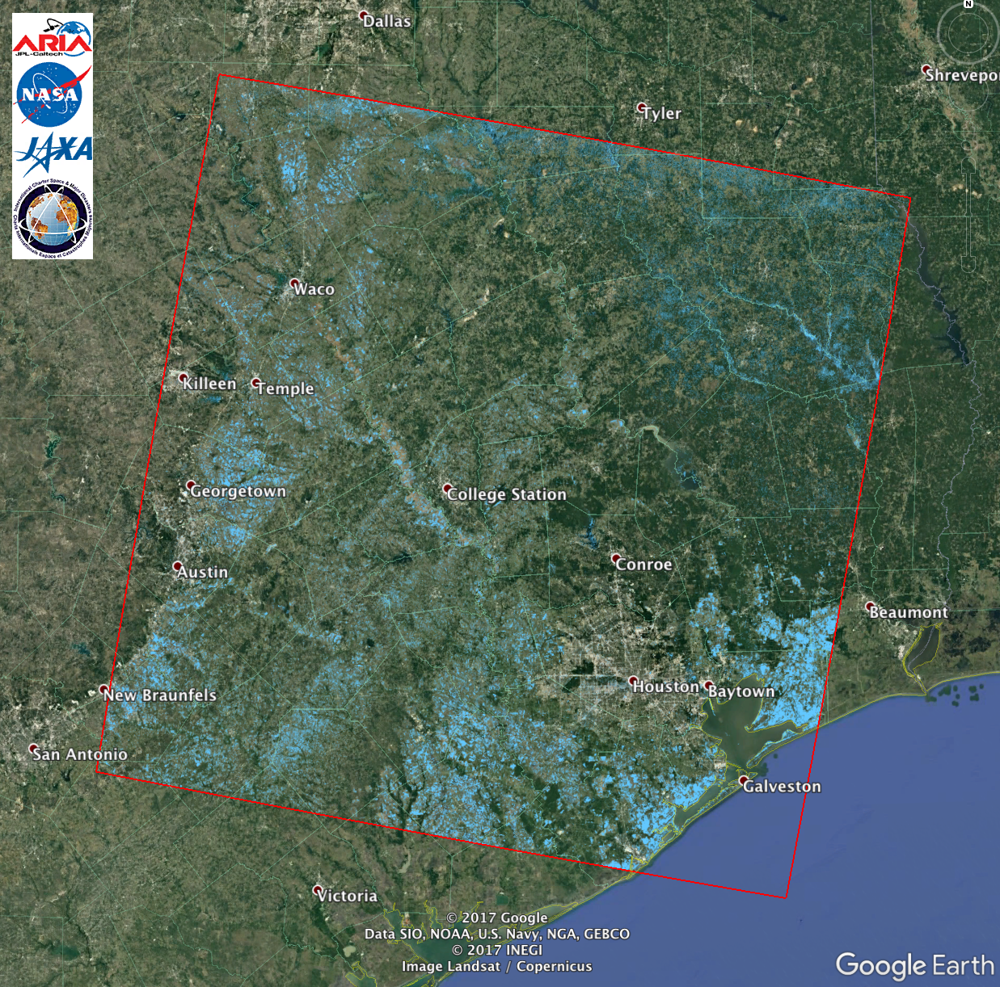

In [56]:
from IPython.display import Image
Image(filename = "ARIA_FPM_ALOS-2_v0.1_f3000.png")

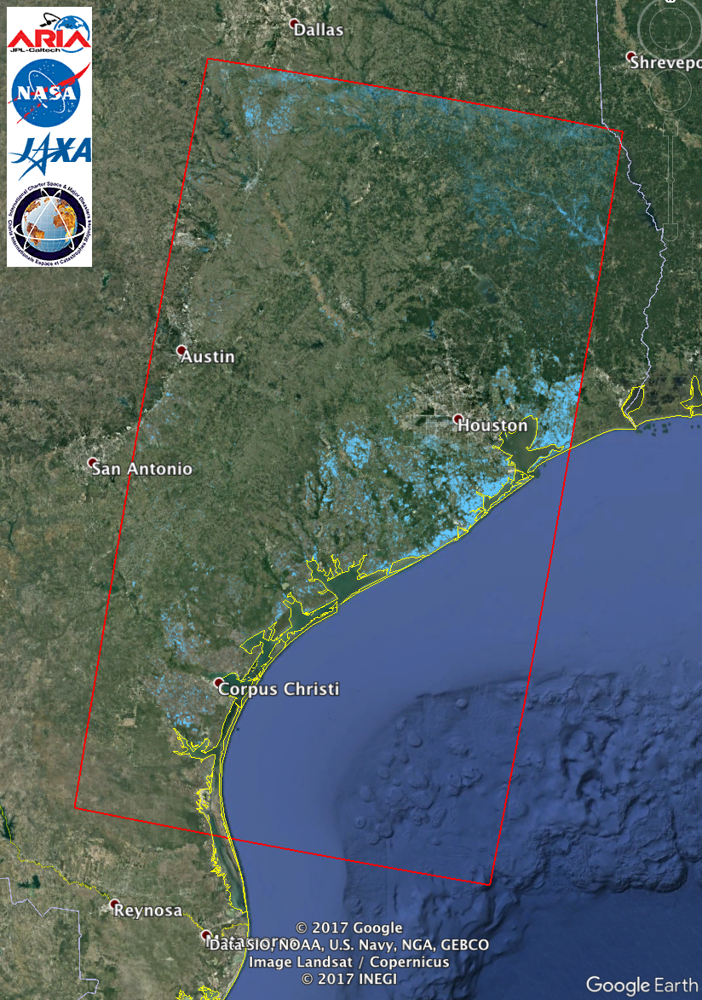

In [58]:
from IPython.display import Image
Image(filename = "ARIA_FPM_ALOS-2_v0.2.png")

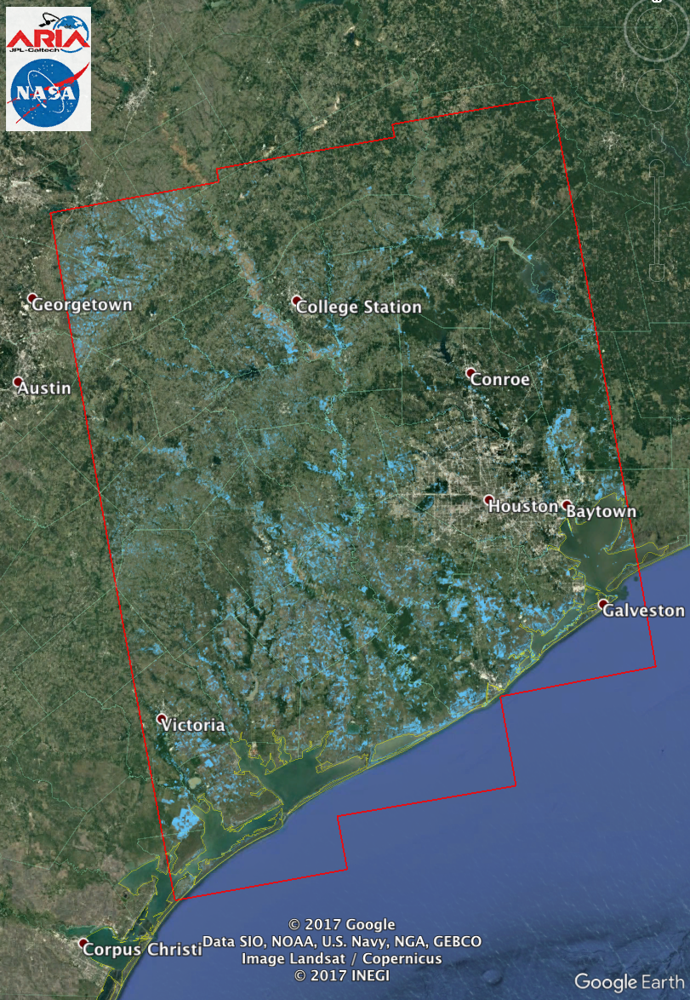

In [59]:
from IPython.display import Image
Image(filename = "ARIA_FPM_Sentinel-1_v0.2.png")

## Calculating meteorological variables

### - Precipiation:

#### Results obtained through a rain gauge:

In [6]:
n = int(input("Amount of days precipitation measurements were collected for an allocated zone: "))

l = []
for i in range(1,n+1):
    print("In day",i)
    ca = int(input("Input how much water has precipitated (mm) "))
    l.append(ca)
precipitacion = sum(l)
print("\nThe amount of accumulated precipitation in {} days for allocated zone is: {:.1f}mm".format(n,precipitacion))

Amount of days precipitation measurements were collected for an allocated zone: 5
In day 1
Input how much water has precipitated (mm) 1000
In day 2
Input how much water has precipitated (mm) 1330
In day 3
Input how much water has precipitated (mm) 1200
In day 4
Input how much water has precipitated (mm) 1400
In day 5
Input how much water has precipitated (mm) 1300

The amount of accumulated precipitation in 5 days for allocated zone is: 6230.0mm


### - Getting an average value of precipitation:

In [7]:
prec_prom = precipitacion/n
print("Average precipitation = {}mm ".format(prec_prom))

Average precipitation = 1246.0mm 


### - Calculating the Monthly Average Temperature:

In [8]:
#TMD is the daily average temperature
#TMM is the monthly average temperature
#If the value of the temperature at 18:00 is not recorded, please input 'NN'.

dias = int(input("Input the number of days at which the temperatures are given in the times: 07:00,13:00, 18:00, 19:00, : "))

l_temp = []

for i in range(1,dias+1):
    print("Day",i)
    t07 = float(input("Temperature at 07:00: "))
    t13 = float(input("Temperature at 13:00: "))
    t18 = input(("Temperature at 18:00: "))
    if t18 == "NN":
        t19 = float(input("Temperature at 19:00: "))
        TMD = (t07+t13+2*t19)/3
        l_temp.append(TMD)
    else:
        t18 = float(t18)
        TMD = (t07+t13+t18)/3
        l_temp.append(TMD)
    
TMM = sum(l_temp)/dias        
print("\nMonthly average temperature: {:.2f}°C".format(TMM))


Input the number of days at which the temperatures are given in the times: 07:00,13:00, 18:00, 19:00, : 5
Day 1
Temperature at 07:00: 26
Temperature at 13:00: 29
Temperature at 18:00: 26
Day 2
Temperature at 07:00: 27
Temperature at 13:00: 30
Temperature at 18:00: NN
Temperature at 19:00: 28
Day 3
Temperature at 07:00: 26
Temperature at 13:00: 31
Temperature at 18:00: NN
Temperature at 19:00: 27
Day 4
Temperature at 07:00: 25
Temperature at 13:00: 32
Temperature at 18:00: 29
Day 5
Temperature at 07:00: 27
Temperature at 13:00: 33
Temperature at 18:00: 20

Monthly average temperature: 31.40°C


### - Maximum Temperature

In [9]:
f_dia,f_mes,f_año = input("Input the date when the temperature was first recorded (DAY/MONTH/YEAR): ").split("/")
Tmax = max(l_temp)
print("\nThe highest temperature recorded after {} days since {}/{}/{} is: {:.2f}°C".format(i, f_dia,f_mes,f_año,Tmax))

Input the date when the temperature was first recorded (DAY/MONTH/YEAR): 11/2/1027

The highest temperature recorded after 5 days since 11/2/1027 is: 37.67°C


### - Minimum Temperature

In [10]:
f_dia,f_mes,f_año = input("Input the date when the temperature was first recorded (DAY/MONTH/YEAR): ").split("/")
Tmin = min(l_temp)
print("\nThe minimum temperature recorded after {} days since {}/{}/{} is: {:.2f}°C".format(i,f_dia,f_mes,f_año,Tmin))

Input the date when the temperature was first recorded (DAY/MONTH/YEAR): 11/2/1027

The minimum temperature recorded after 5 days since 11/2/1027 is: 26.67°C


## - Wind Velocity
Wind velocity is based in the Saffir-Simpson Scale. Given that in this case the flooding is produced by a hurracaine, the wind velocity becomes the only relevant parameter.

Reference:
- CHAPTER 12 - HURRICANE HAZARDS. (s. f.). OAS. Recovered september 23,2020. http://www.oas.org/dsd/publications/unit/oea66e/ch12.htm

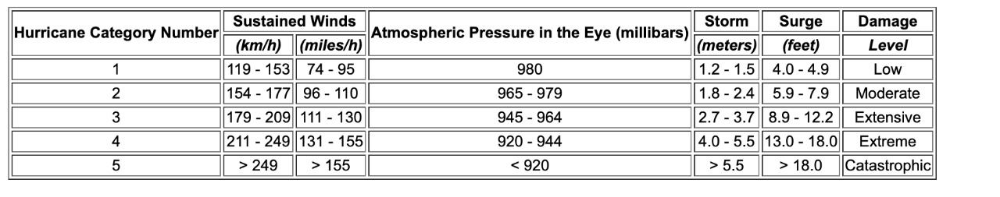

In [1]:
from IPython.display import Image
Image(filename = "Saffir-Simpson Scale.jpeg")

In [11]:
vel = float(input("Input the wind velocity[km/h]: "))

Input the wind velocity[km/h]: 250


## Relating the COD with wind velocity:

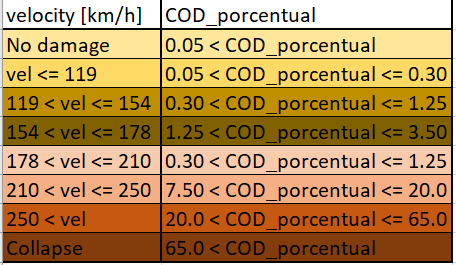

In [13]:
from IPython.display import Image
Image(filename = "relationship.png")

## Calculating the economical loss:


In [16]:
#value_hospital (Health Facilities monetary value) = $697608632.09
#valor_escuela (Educational Institutuions monetary value) = $1166063238.45

valor_hospital = float(input("Please input the average monetary value of a Health Facilities[$]: "))
valor_escuela  = float(input("Please input the average monetary value of an Educational Institutions[$]: "))

if (0 < COD_porcentual <= 0.05):
    print("\nIt appears that no damage is presented in the infrastructure.")
elif vel <= 119:
    print("\nA non-infrastructural related damage exists. " 
        "The monetary loss ($) is: {:.2f}$ in health facilities and {:.2f}$ "
        "in educational institutions".format(hospitales(COD_porcentual), escuelas(COD_porcentual)))
elif 119 < vel <= 154:
    print("\nNon-structural damage has been localized. "
        "The monetary loss($) is: {:.2f}$ in health facilities and {:.2f}$ " 
        "in educational institutions".format(hospitales(COD_porcentual), escuelas(COD_porcentual)))
elif 154 < vel <= 178:
    print("\nStructural damage was caused. "
        "Monetary loss ($) is: {:.2f}$ in health facilities and {:.2f}$ "
        "in edicational institutions".format(hospitales(COD_porcentual), escuelas(COD_porcentual)))
elif 178 < vel <= 210:
    print("\nMinor strucutural damage. "
        "The monetary loss($) is: {:.2f}$ in health facilities and {:.2f}$ "
        " in educational institutions".format(hospitales(COD_porcentual), escuelas(COD_porcentual)))        
elif 210 < vel <= 250:
    print("\nSubstancial structural damage. "
        "The monetary loss($) is: {:.2f}$ in health facilities and {:.2f}$ "
        "in educational institutions".format(hospitales(COD_porcentual), escuelas(COD_porcentual)))
elif 250 < vel:
    print("\nMajor structural damage. "
        "The monetary loss($) is: {:.2f}$ in health facilities and {:.2f}$ "
        "in educational institutions".format(hospitales(COD_porcentual), escuelas(COD_porcentual)))
elif 65.0 < COD_porcentual:
    print("\nTotal loss- the building has collapsed, or was almost totally destroyed")

print("\nCOD difference: {}%".format(COD_porcentual))
print("\nThe wind velocity is {:.2f}km/h".format(vel))
print("\nThe average temperature is {:.2f}°C".format(TMM))
print("\nThe average precipitation is {}mm".format(prec_prom))

Please input the average monetary value of a Health Facilities[$]: 697608632.09
Please input the average monetary value of an Educational Institutions[$]: 1166063238.45

Substancial structural damage. The monetary loss($) is: 348804316.05$ in health facilities and 583031619.23$ in educational institutions

COD difference: 30.0%

The wind velocity is 250.00km/h

The average temperature is 31.40°C

The average precipitation is 1246.0mm
